## Decentralized Consensus Algorithms 
###### * Average Consensus: The implementation simulates agents averaging positions with neighbors. This reflects the mathematical foundation of average consensus in distributed systems.

## Section 3.1: Average Consensus with Sparse Polygonal Obstacles

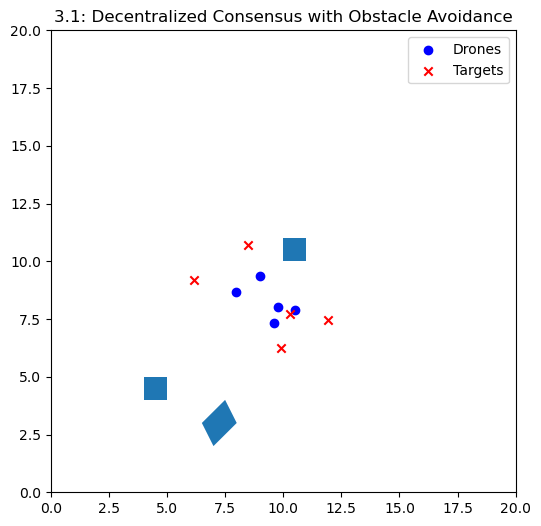

In [9]:
# Section 3.1: Basic Decentralized Consensus (Averaging) with Obstacle Avoidance
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.patches import Polygon

# --- Initialization (Simulation Parameters / Environment Setup) ---
n_drones = 5
positions = np.random.rand(n_drones, 2) * 10
targets = np.random.rand(n_drones, 2) * 10 + 5
learning_rate = 0.03
stop_threshold = 0.1
obstacles = [
    Polygon([[4,4], [5,4], [5,5], [4,5]], closed=True),
    Polygon([[10,10], [11,10], [11,11], [10,11]], closed=True),
    Polygon([[7,2], [8,3], [7.5,4], [6.5,3]], closed=True)
]

# --- Setup Figure ---
fig, ax = plt.subplots(figsize=(6,6))
sc = ax.scatter(positions[:,0], positions[:,1], c='blue', label='Drones')
target_sc = ax.scatter(targets[:,0], targets[:,1], c='red', marker='x', label='Targets')
for poly in obstacles:
    ax.add_patch(poly)
ax.set_xlim(0, 20)
ax.set_ylim(0, 20)
ax.legend()
ax.set_title('3.1: Decentralized Consensus with Obstacle Avoidance')

is_paused = False

# --- Algorithm (UAV Behavior Logic) ---
def update(frame):
    global positions, is_paused
    if not is_paused:
        new_positions = positions.copy()
        for i in range(n_drones):
            neighbors = [j for j in range(n_drones) if j != i]
            avg_pos = np.mean(positions[neighbors], axis=0)
            direction = avg_pos - positions[i] + (targets[i] - positions[i])

            # Obstacle Avoidance
            for poly in obstacles:
                for vx, vy in poly.get_xy():
                    dist = np.linalg.norm(positions[i] - [vx, vy])
                    if dist < 1.0:
                        direction += (positions[i] - [vx, vy]) * 0.5

            norm = np.linalg.norm(direction)
            if norm > 0:
                direction = direction / norm
                if np.linalg.norm(targets[i] - positions[i]) > stop_threshold:
                    new_positions[i] += learning_rate * direction

        positions[:] = new_positions
        sc.set_offsets(positions)
    return sc,

# --- Play/Pause Logic ---
def on_click(event):
    global is_paused
    if event.inaxes is not None:
        is_paused = not is_paused

fig.canvas.mpl_connect('button_press_event', on_click)
anim = FuncAnimation(fig, update, frames=500, interval=10, blit=True)
HTML(anim.to_jshtml())